Loading: /Users/christiankwok/my wunderfund_challenge/wunderfund_challenge/competition_package/examples/delta_predict_3/lstm_weights.pt
Shapes: (936, 32) (936, 32)


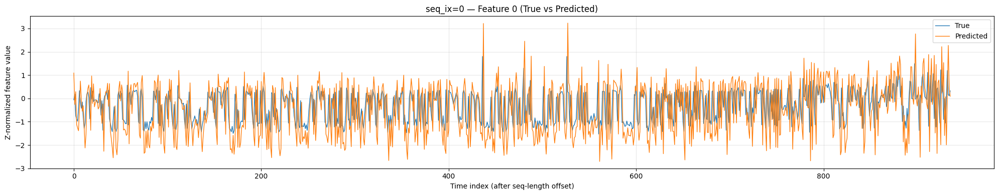

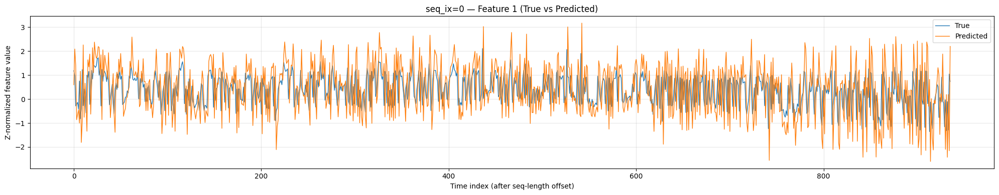

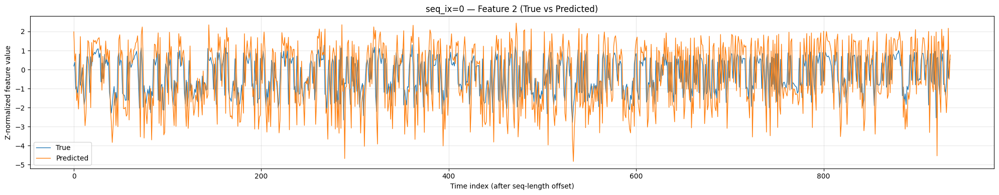

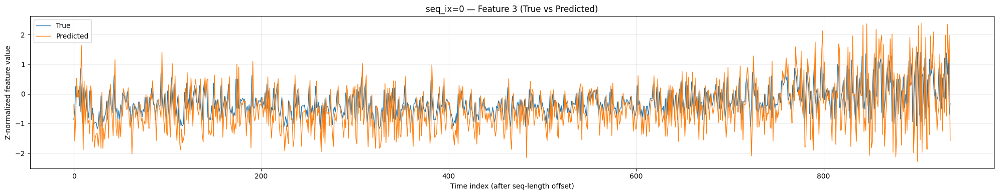

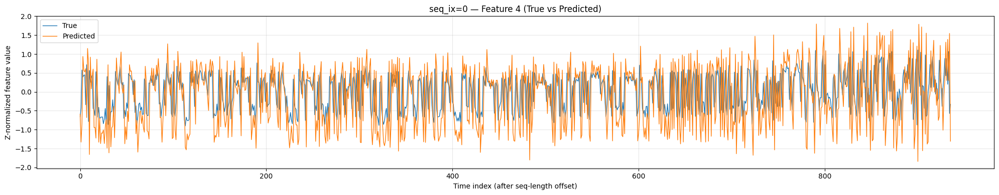

...

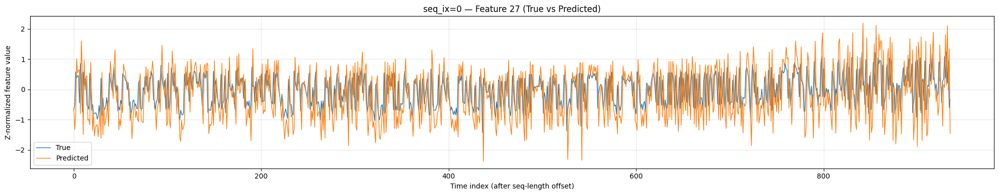

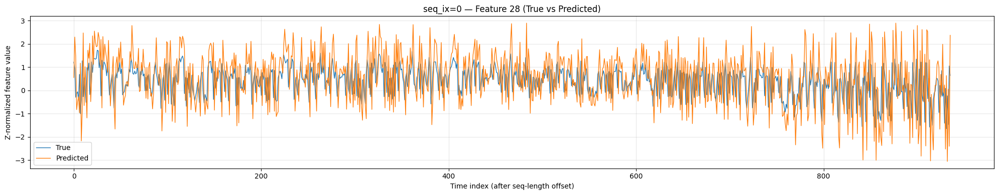

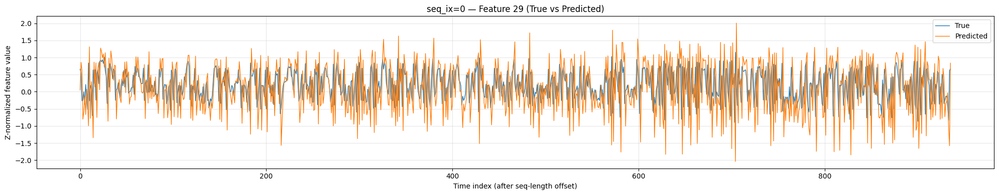

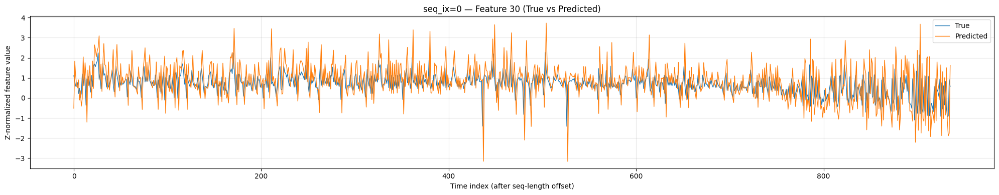

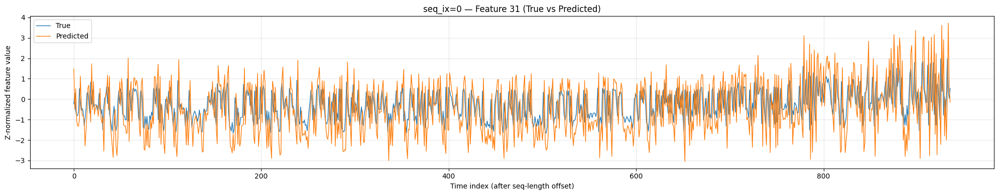


Done plotting ✓


In [2]:
import os, sys, numpy as np, torch, torch.nn as nn, pandas as pd, matplotlib.pyplot as plt

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
CURRENT_DIR = os.getcwd()
sys.path.append(f"{CURRENT_DIR}/../..")
from utils import ScorerStepByStep

# ---------------- MODEL ---------------- #
class PredictionModel(nn.Module):
    def __init__(self):
        super().__init__()

        self.input_dim = 64        # raw32 + rm5_32
        self.output_dim = 32       # delta
        self.hidden_size = 64
        self.num_layers = 1

        self.lstm = nn.LSTM(self.input_dim, self.hidden_size, self.num_layers, batch_first=True)
        self.fc = nn.Linear(self.hidden_size, self.output_dim)

        weights_path = os.path.join(CURRENT_DIR, "lstm_weights.pt")
        print("Loading:", weights_path)
        self.load_state_dict(torch.load(weights_path, map_location=DEVICE))
        self.to(DEVICE)

    def forward(self, x):
        out, _ = self.lstm(x)
        return self.fc(out[:, -1])   # delta_hat


def make_sequences(arr64, seq_len=64):
    """
    X: windows of length seq_len (up to time t-1)
    y_true_raw: raw at time t   (truth for next step)
    prev_raw:   raw at time t-1 (needed to reconstruct raw_hat = prev_raw - delta_hat)
    """
    X, y_true_raw, prev_raw = [], [], []
    raw_only = arr64[:, :32]

    for i in range(len(arr64) - seq_len):
        t = i + seq_len
        X.append(arr64[i:t])               # features up to t-1
        y_true_raw.append(raw_only[t])     # raw at t
        prev_raw.append(raw_only[t - 1])   # raw at t-1

    return np.stack(X), np.stack(y_true_raw), np.stack(prev_raw)


# -------------- LOAD DATA -------------- #
seq_id = 0
train_file = f"{CURRENT_DIR}/../../datasets/train.parquet"
scorer = ScorerStepByStep(train_file)
df = scorer.dataset

df_seq = df[df["seq_ix"] == seq_id].sort_values("step_in_seq").reset_index(drop=True)

raw = df_seq.iloc[:, 3:35].to_numpy().astype(np.float32)
rm5 = pd.DataFrame(raw).rolling(5, min_periods=1).mean().to_numpy().astype(np.float32)
arr64 = np.concatenate([raw, rm5], axis=1).astype(np.float32)

X_np, y_true_raw, prev_raw = make_sequences(arr64, seq_len=64)
X = torch.tensor(X_np, dtype=torch.float32).to(DEVICE)

# -------------- PREDICT -------------- #
model = PredictionModel()
model.eval()
with torch.no_grad():
    delta_hat = model(X).cpu().numpy()          # shape (N, 32)

# *** this is the key: reconstruct the raw prediction the same way as in predict() ***
y_pred_raw = prev_raw - delta_hat               # or + delta_hat, depending on version

print("Shapes:", y_true_raw.shape, y_pred_raw.shape)

# -------------- PLOT -------------- #
for k in range(32):
    plt.figure(figsize=(20, 4))
    plt.plot(y_true_raw[:, k], label="True", linewidth=1)
    plt.plot(y_pred_raw[:, k], label="Predicted", linewidth=1)
    plt.title(f"seq_ix={seq_id} — Feature {k} (True vs Predicted)")
    plt.xlabel("Time index (after seq-length offset)")
    plt.ylabel("Z-normalized feature value")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

print("\nDone plotting ✓")
